this code looks in atmmodel.csv, finds unique POB information, opens corresponding hdf files and visualizes POB imgaes based on selected POB infor from atmmodel.csv

needs MTK so use it with python-3.6

In [1]:
import MisrToolkit as Mtk
from MisrToolkit import *
import os
import pandas as pd
import numpy as np
from matplotlib import image as pltimg, pyplot as plt  #  pyplot uses the actual RGB values as they are, more accurate than PIL


In [7]:
def find_unique_pob(atmmodel_file_fp, list_of_columns):
    
    print('found input file: %s' %(os.path.isfile(atmmodel_file_fp)))
    in_csv_df = pd.read_csv(atmmodel_file_fp)
    print(in_csv_df.columns)
    pob_unique = in_csv_df.drop_duplicates(subset=list_of_columns, keep='first', ignore_index=False)
    pob_unique.info()
    
    return pob_unique

In [3]:
# from matplotlib import image as pltimg, pyplot as plt  #  pyplot uses the actual RGB values as they are, more accurate than PIL

def plot_here_and_write(in_arr, img_dir, start_blk, end_blk):
    write_mode = 0
    
    %matplotlib inline 
    plt.gray() # This will show the images in grayscale as default
    plt.figure(figsize=(30,30))  # set the figure size
    plt.imshow(in_arr)
    plt.show()
    
#     if (write_mode):
#             img_label = 'path_'+path_num+'_'+'blocks_'+str(start_blk)+'_'+str(end_blk)+'_cam_'+cam
#             img_format = ".jpg"
#         print('save mode: on, we write images to disc')
        
#         out_img = img_label+img_format
#         out_img_fullpath = os.path.join(img_dir, out_img)
#         print("-> output img is: %s" %out_img_fullpath)
#         pltimg.imsave(out_img_fullpath, in_arr)
#         #     plt.savefig(out_img)
    
    return 0


In [4]:
hdf_dir = "/Volumes/Ehsan-7757225325/2016/july_2016/ellipsoid_files"


# hdf_dir = "/Volumes/Ehsan-7757225325/2016/july_2016/ellipsoid_files/elliposid_files_used_for_mapping"

os.path.isdir(hdf_dir)

True

In [5]:
# atmmodel_csv = 'atmmodel_july_2016_1to16.csv'
# home_dir = '/Users/ehsanmos/MLP_dataset/july_2016'

# april
atmmodel_csv = 'atmmodel_july_2016_k_zero.csv'
home_dir = "/Volumes/Ehsan-7757225325/2016/july_2016/atmmodel"


# july
# atmmodel_csv = 'atmmodel_july_2016_1to16.csv'
# home_dir = '/Users/ehsanmos/MLP_dataset/july_2016'


in_csv = os.path.join(home_dir, atmmodel_csv)
print(os.path.isfile(in_csv))

True


## plot images using atmmodel.csv 

In [6]:
# find unique POB in atmmodel.csv 

list_of_cols = ['#path',' orbit', ' img_block']
# list_of_cols = ['path','orbit', 'block']

pob_unique = find_unique_pob(in_csv, list_of_cols)
print(pob_unique.shape)

input file found: True
Index(['#path', ' orbit', ' img_block', ' line', ' sample', ' firstLat',
       ' firstLon', ' an', ' ca', ' cf', ' rms', ' weight', ' npts', ' cloud',
       ' var'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 19283
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   #path       49 non-null     int64  
 1    orbit      49 non-null     int64  
 2    img_block  49 non-null     int64  
 3    line       49 non-null     int64  
 4    sample     49 non-null     int64  
 5    firstLat   49 non-null     float64
 6    firstLon   49 non-null     float64
 7    an         49 non-null     float64
 8    ca         49 non-null     float64
 9    cf         49 non-null     float64
 10   rms        49 non-null     float64
 11   weight     49 non-null     float64
 12   npts       49 non-null     float64
 13   cloud      49 non-null     int64  
 14   var        49 non-n

In [8]:
print(pob_unique.head())


     #path   orbit   img_block   line   sample   firstLat    firstLon  \
0       84   88141          30    400      634  74.129692  199.405884   
79     164   88146           8    345     1110  74.129692  199.405884   
163     91   88156          29    267     1581  74.232342  198.949731   
185    167   88219          10    137     1513  75.114456  186.856273   
187     94   88229          30     75      858  74.565784  187.180177   

           an        ca        cf        rms   weight   npts   cloud       var  
0    0.262749  0.437330  0.407132  10.210000      1.0    1.0      -1  0.000000  
79   0.571981  0.898265  1.826014  11.720000      1.0    2.0      -1  1.510000  
163  0.590927  0.583528  0.953868   3.640000      1.0    2.0      -1  0.050000  
185  0.354636  0.635464  1.853318  13.573333      1.0    3.0      -1  1.402625  
187  0.035022  0.085810  0.079531   5.000000      1.0    3.0      -1  0.035590  


## write out the unique POB info to a file

In [9]:
# output_dir = home_dir
# output_filename = 'uniques_pob_withATMinThem_from_atmmodel.csv'

# pob_unique[['#path',' orbit',' img_block']].to_csv(os.path.join(output_dir, output_filename), index=False)

## visualize unique images in a loop

P=084, O=88141, B=30, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

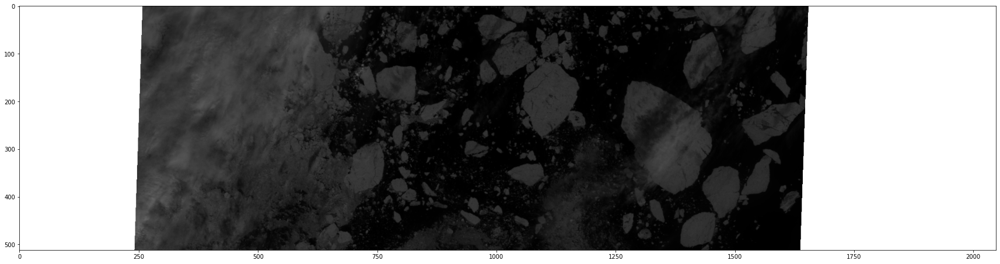

P=164, O=88146, B=8, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

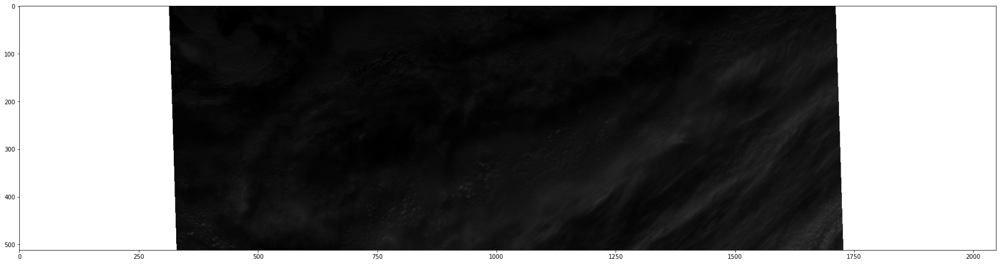

P=091, O=88156, B=29, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

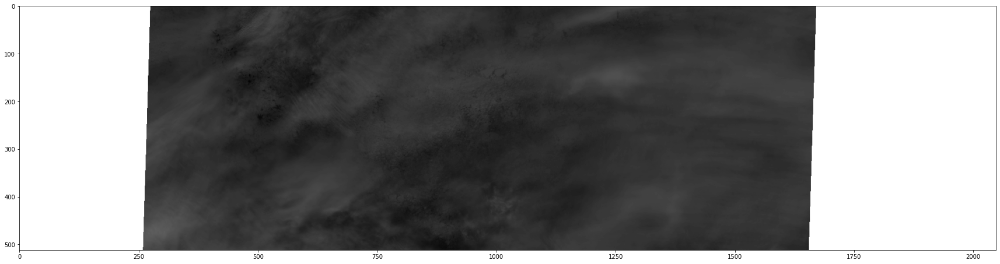

P=167, O=88219, B=10, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

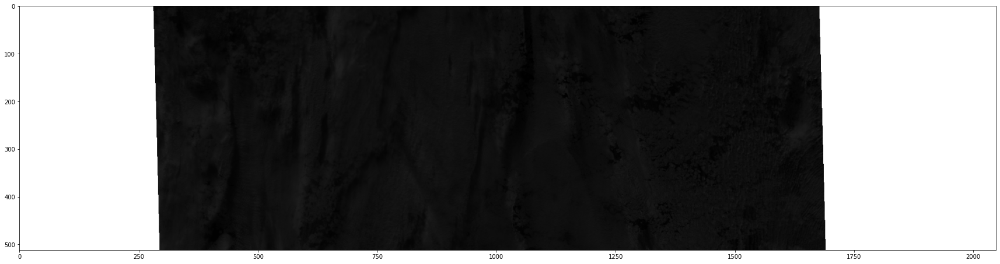

P=094, O=88229, B=30, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

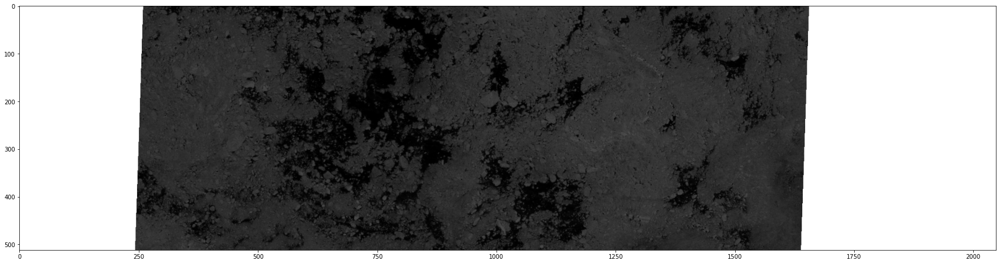

P=094, O=88229, B=29, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

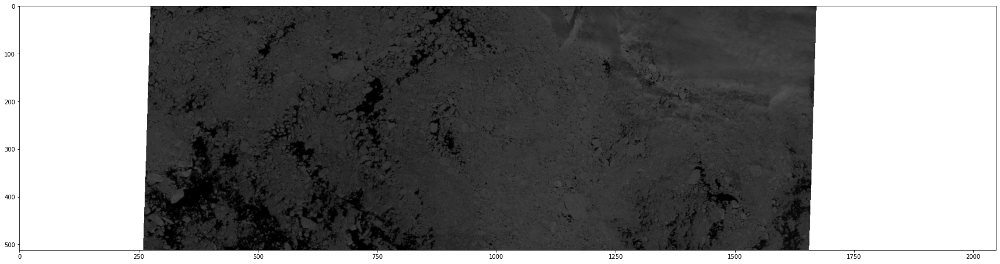

P=142, O=88232, B=13, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

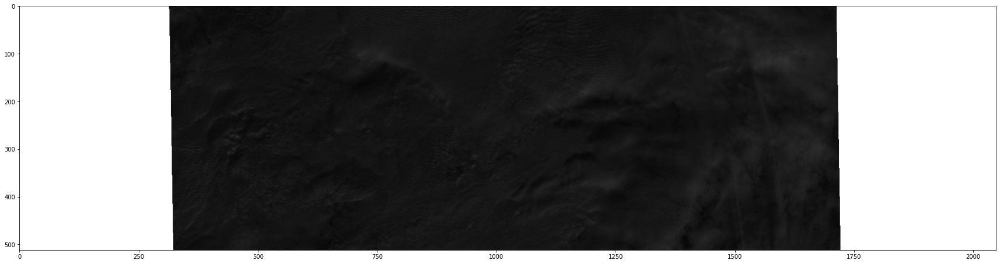

P=085, O=88243, B=26, points-per-pixel= 4.0


<Figure size 432x288 with 0 Axes>

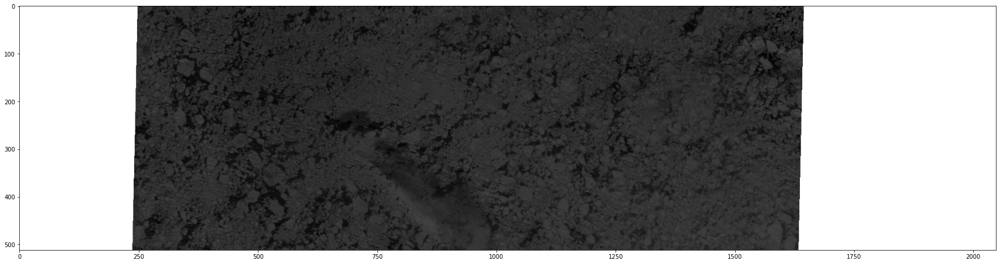

P=103, O=88215, B=27, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

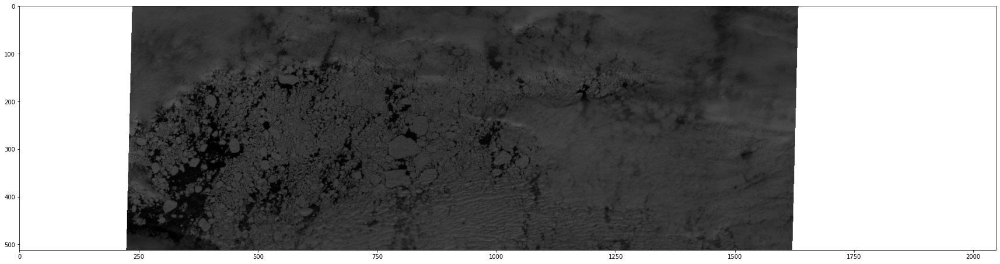

P=167, O=88219, B=11, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

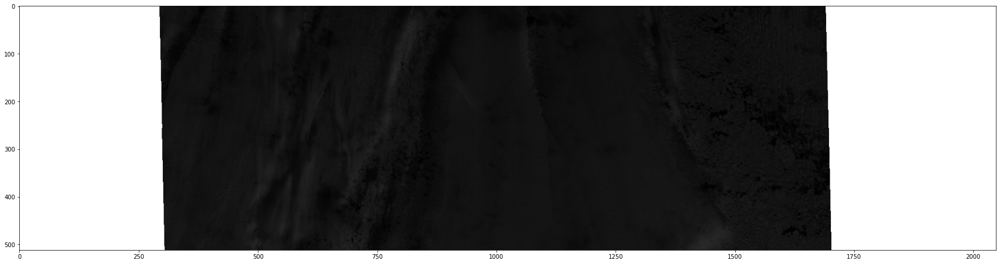

P=094, O=88229, B=28, points-per-pixel= 11.0


<Figure size 432x288 with 0 Axes>

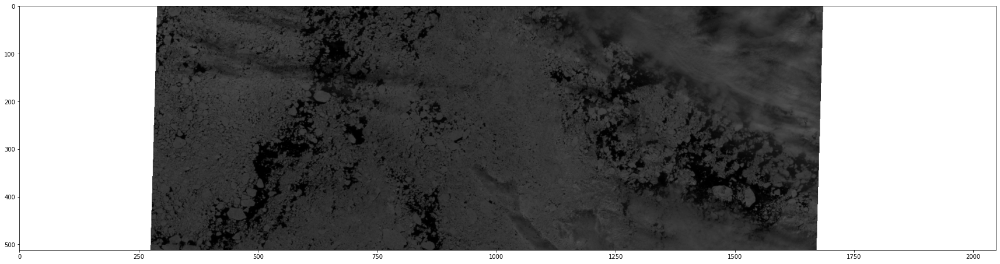

P=098, O=88171, B=30, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

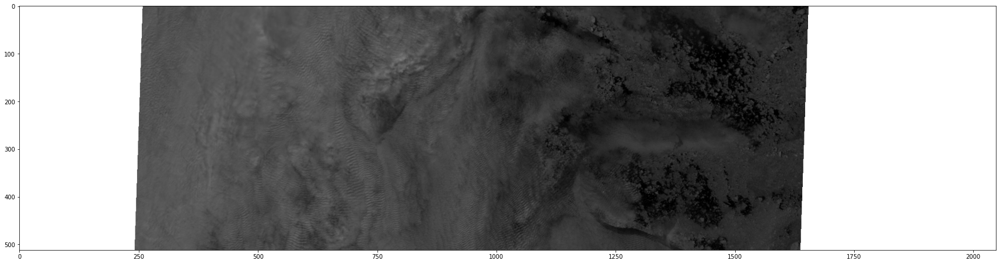

P=089, O=88185, B=31, points-per-pixel= 5.0


<Figure size 432x288 with 0 Axes>

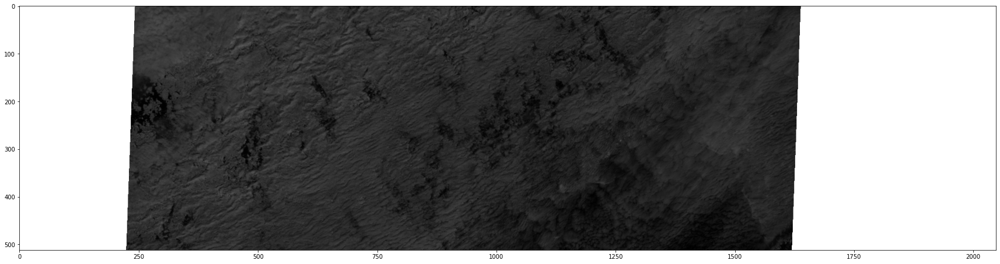

P=084, O=88141, B=29, points-per-pixel= 9.0


<Figure size 432x288 with 0 Axes>

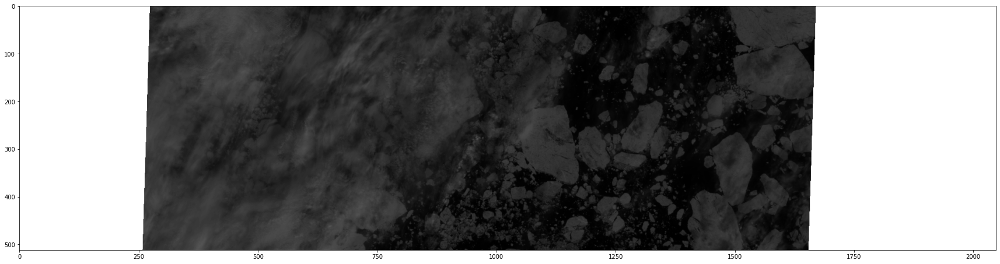

P=164, O=88146, B=10, points-per-pixel= 4.0


<Figure size 432x288 with 0 Axes>

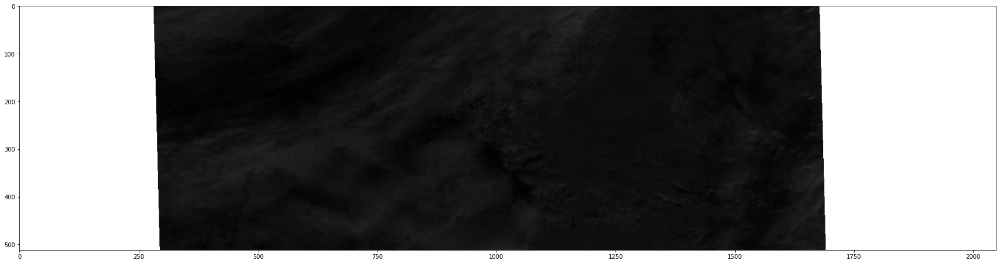

P=164, O=88146, B=9, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

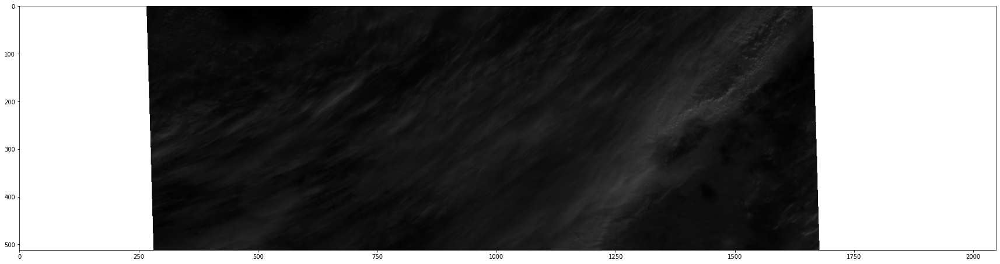

P=091, O=88156, B=28, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

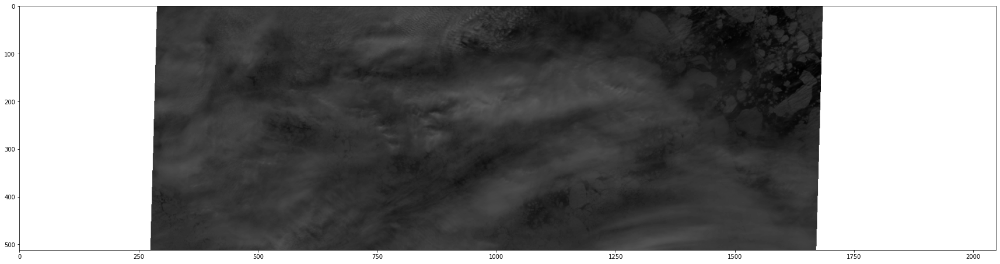

P=085, O=88243, B=25, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

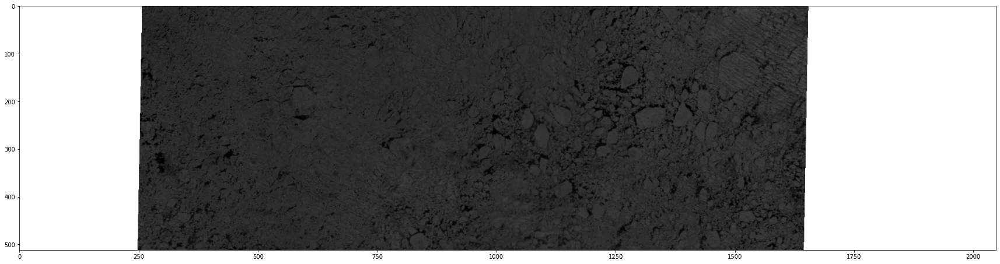

P=133, O=88246, B=14, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

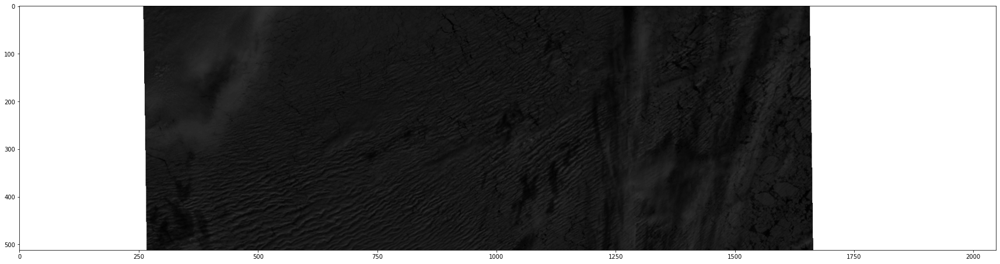

P=076, O=88257, B=27, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

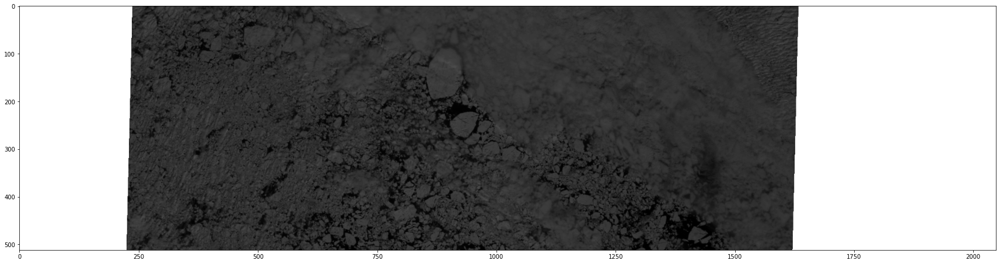

P=076, O=88257, B=26, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

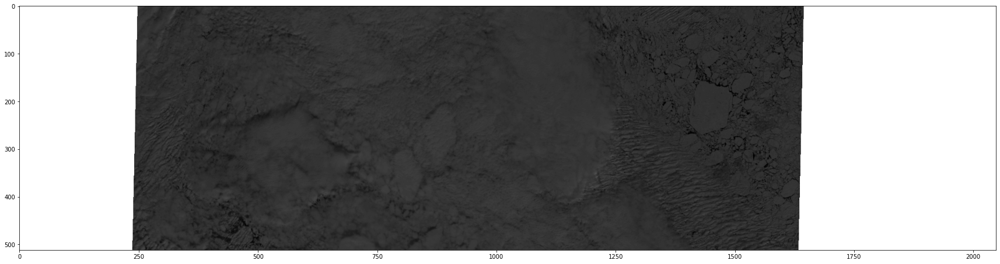

P=092, O=88258, B=24, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

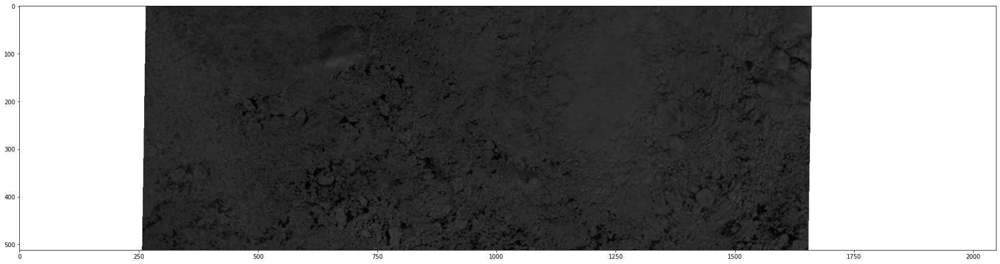

P=092, O=88258, B=23, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

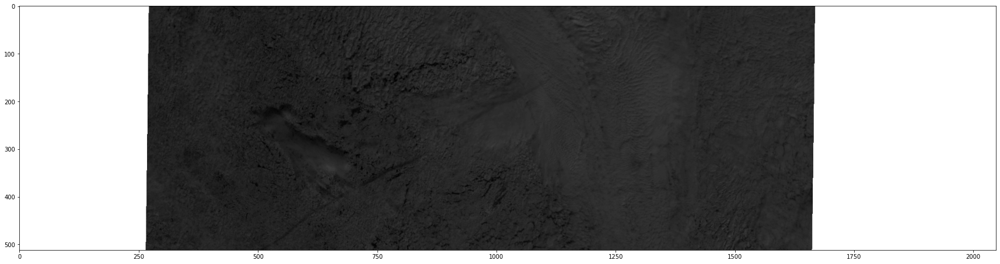

P=093, O=88127, B=27, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

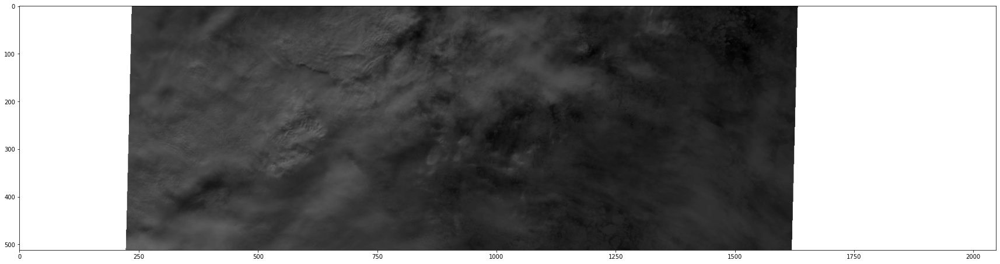

P=157, O=88131, B=11, points-per-pixel= 5.0


<Figure size 432x288 with 0 Axes>

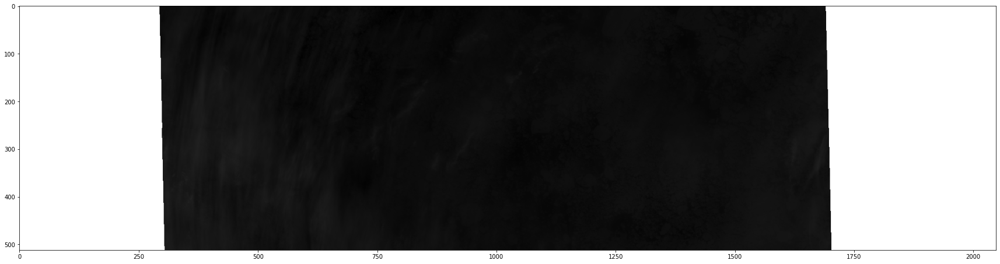

P=149, O=88247, B=9, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

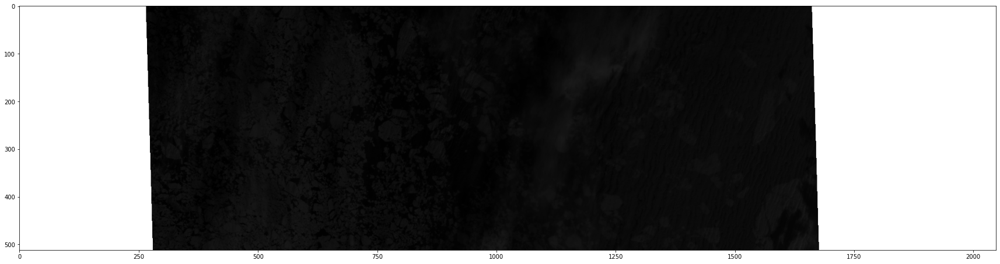

P=149, O=88247, B=10, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

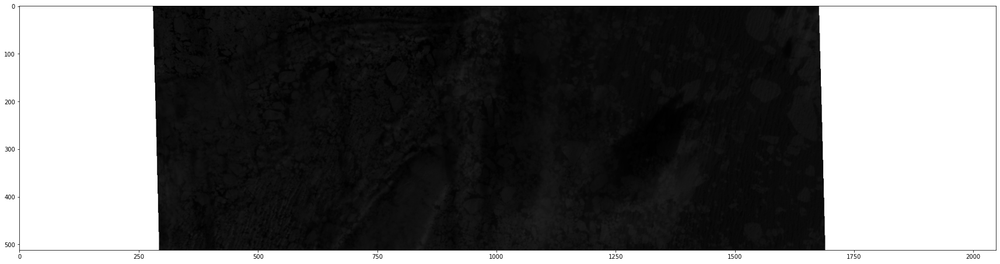

P=076, O=88257, B=29, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

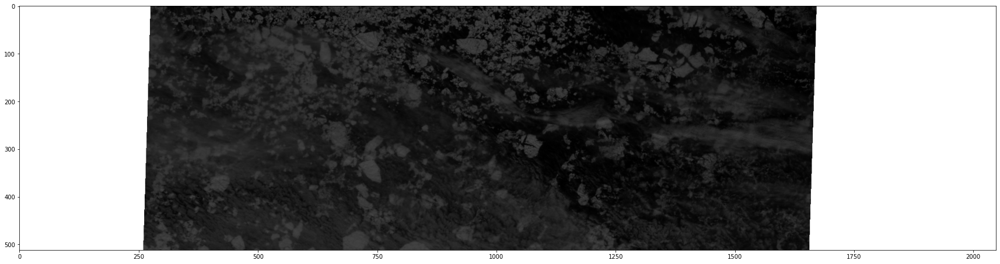

P=076, O=88257, B=28, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

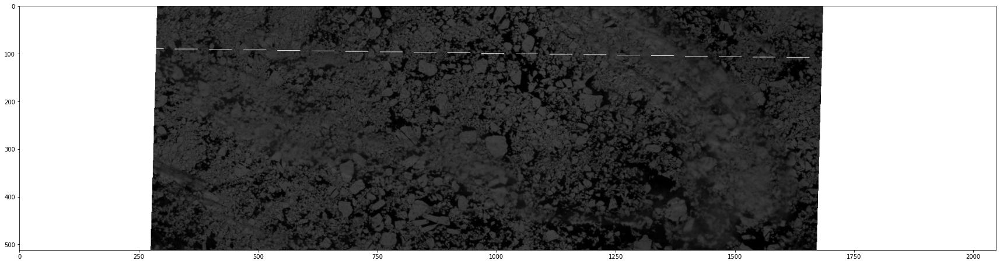

P=100, O=88142, B=26, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

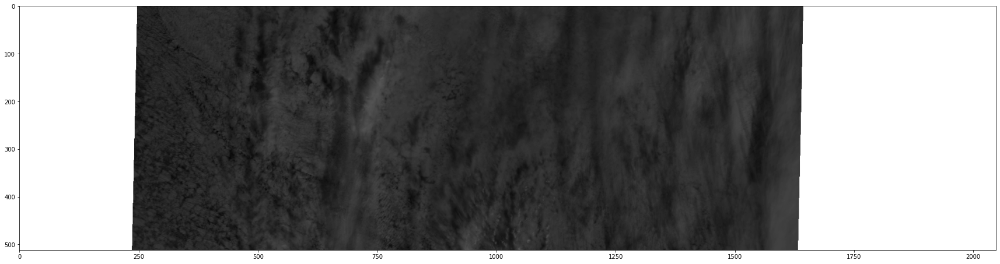

P=164, O=88146, B=11, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

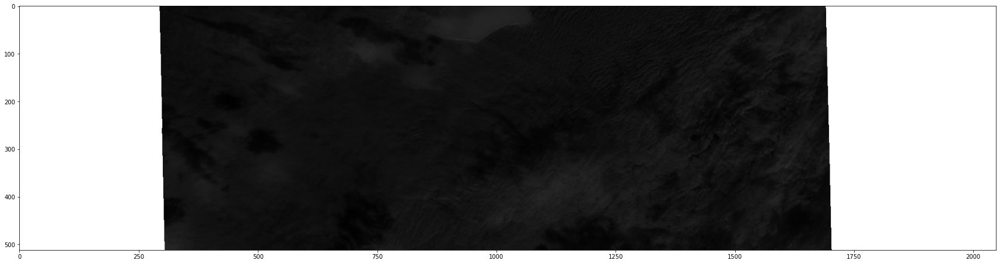

P=091, O=88156, B=27, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

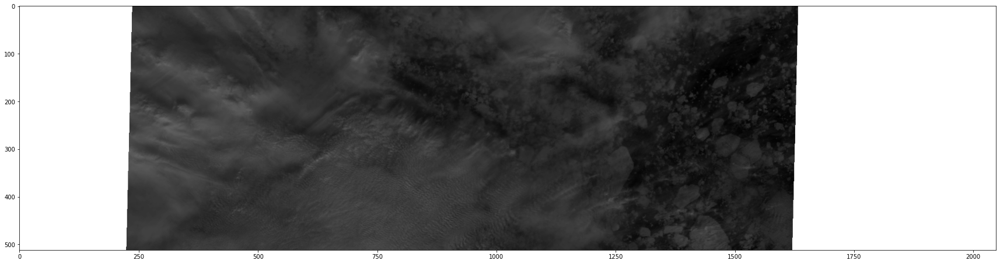

P=157, O=88131, B=9, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

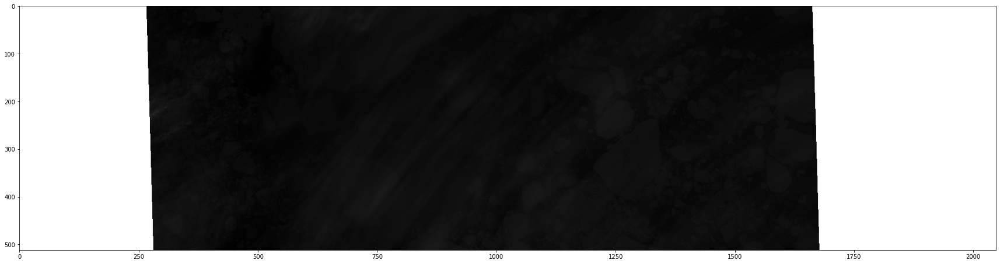

P=084, O=88141, B=28, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

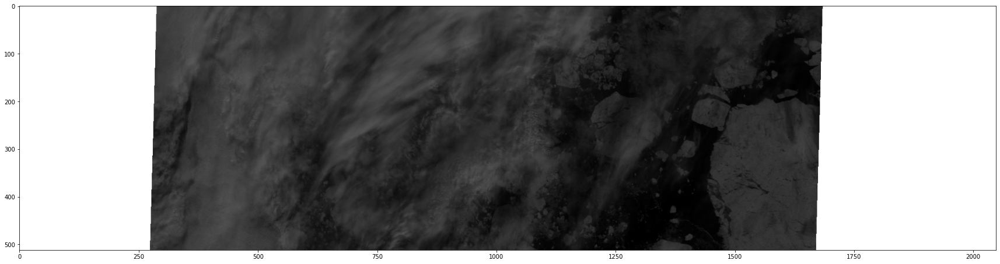

P=157, O=88131, B=10, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

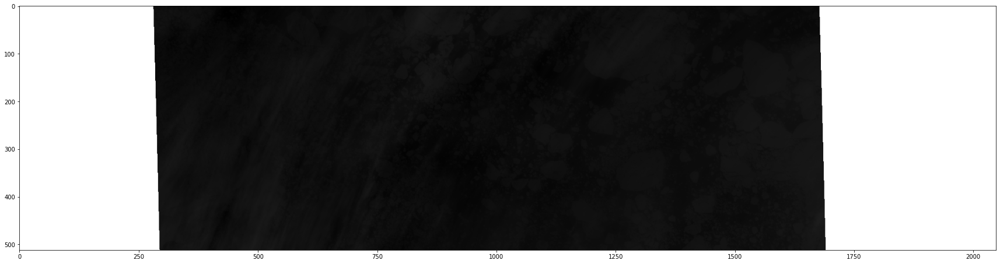

P=100, O=88142, B=27, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

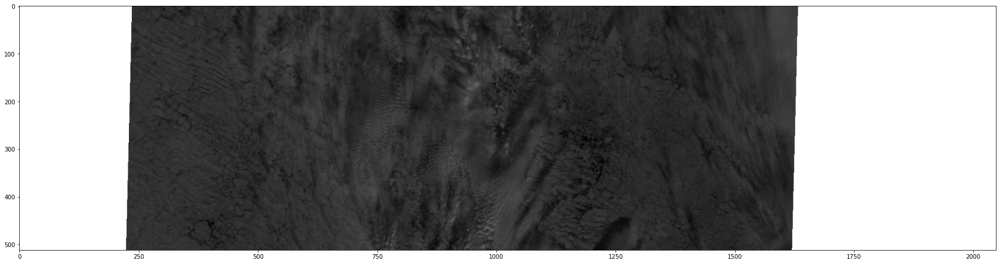

P=167, O=88219, B=9, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

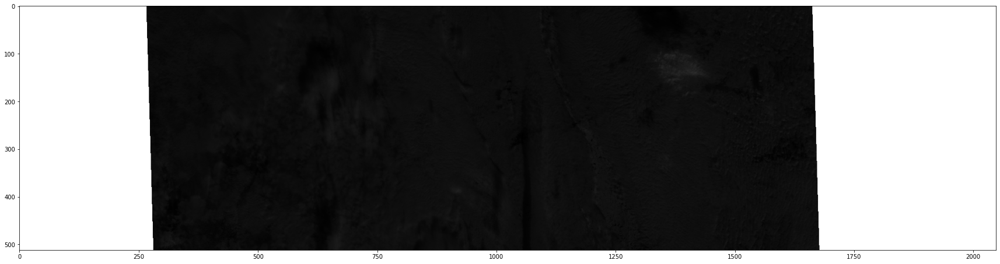

P=094, O=88229, B=23, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

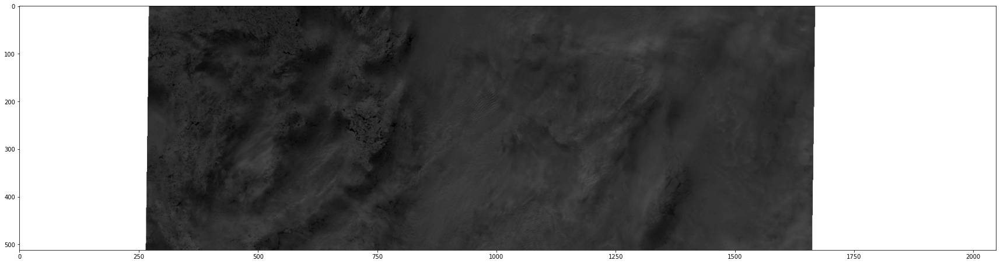

P=149, O=88247, B=11, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

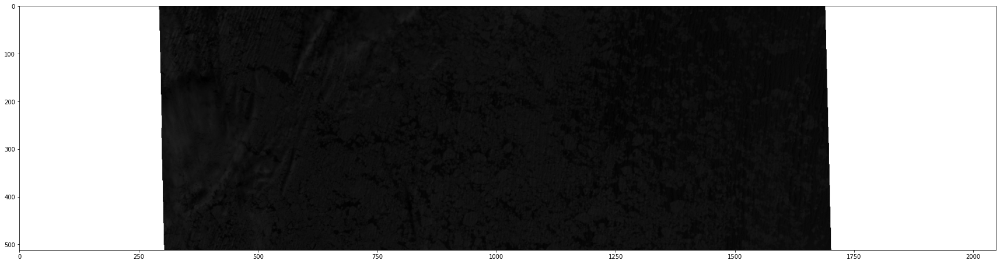

P=158, O=88233, B=9, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

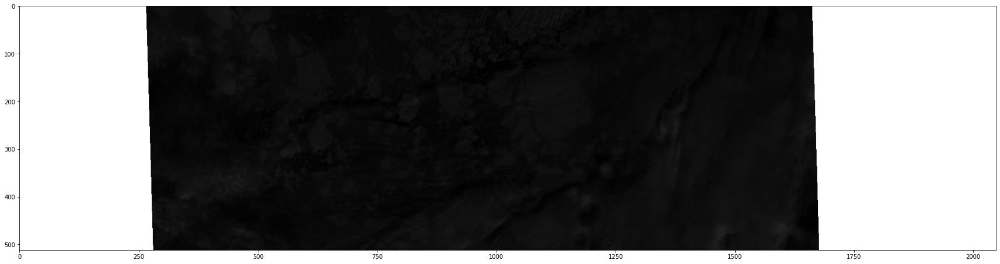

P=085, O=88243, B=28, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

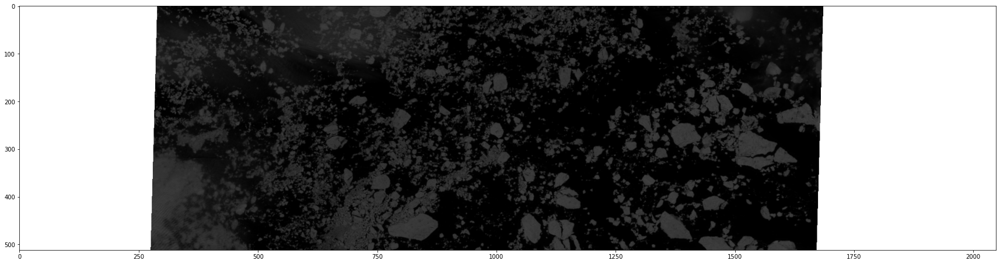

P=085, O=88243, B=27, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

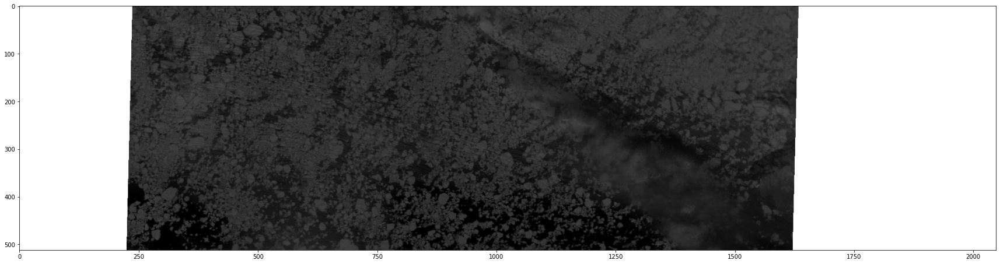

P=087, O=88214, B=32, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

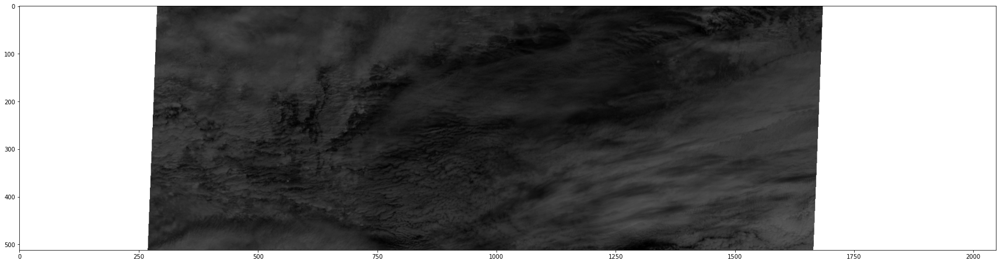

P=094, O=88229, B=31, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

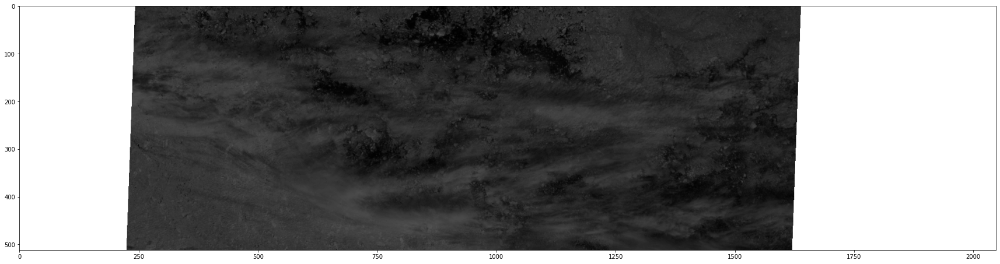

P=157, O=88131, B=8, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

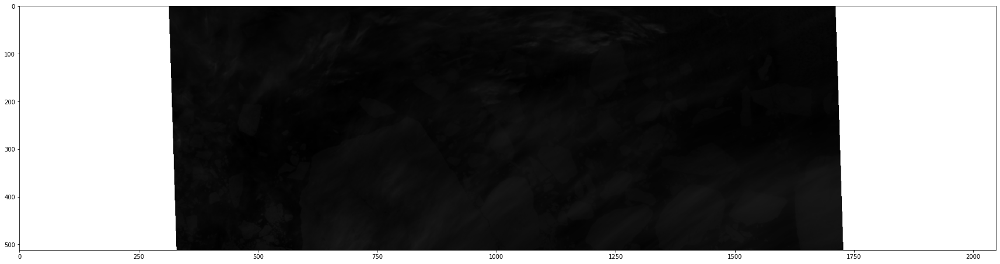

P=093, O=88127, B=28, points-per-pixel= 5.0


<Figure size 432x288 with 0 Axes>

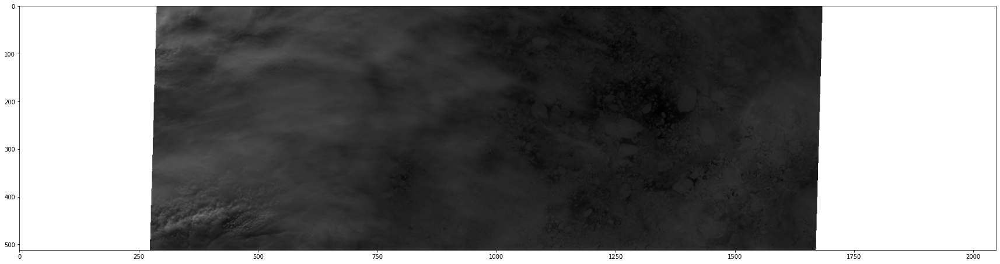

P=098, O=88171, B=29, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

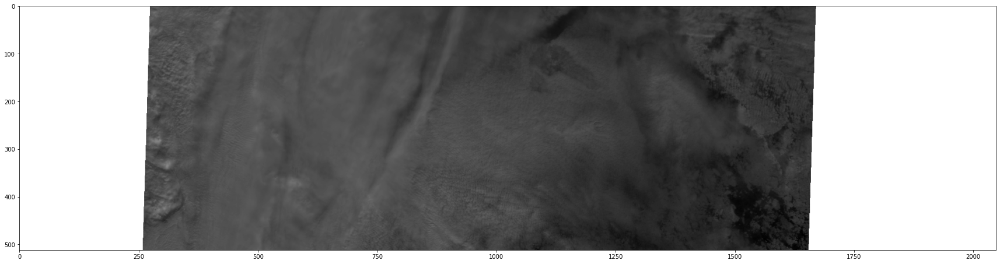

P=149, O=88247, B=12, points-per-pixel= 4.0


<Figure size 432x288 with 0 Axes>

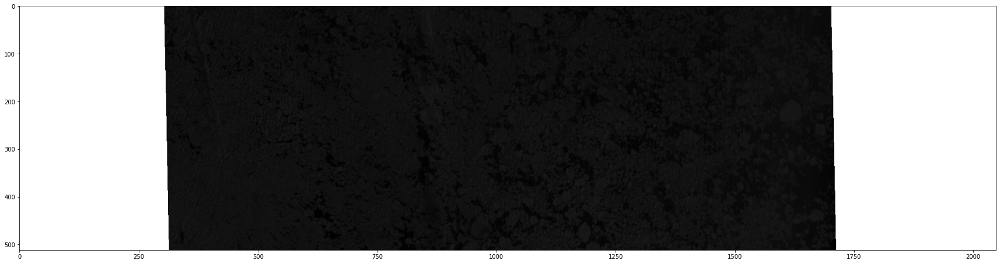

P=084, O=88141, B=27, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

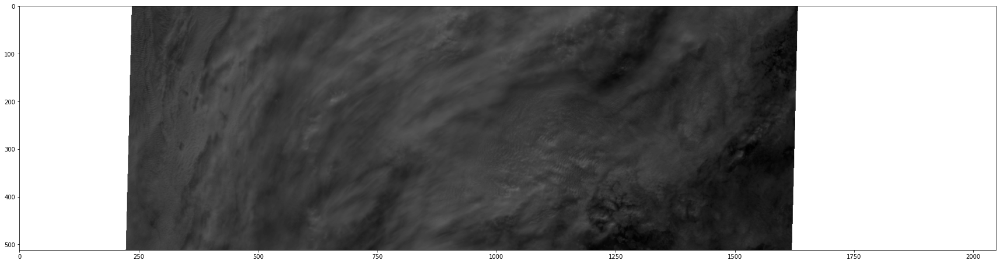

successfully printed 49 files!


In [10]:
for row_indx in range(pob_unique.shape[0]):
    
#     path_num = pob_unique['path'].iloc[row_indx]
#     orbit_num_str = str(pob_unique['orbit'].iloc[row_indx])
#     start_block = str(pob_unique['block'].iloc[row_indx])


    path_num = pob_unique['#path'].iloc[row_indx]
    orbit_num_str = str(pob_unique[' orbit'].iloc[row_indx])
    start_block = str(pob_unique[' img_block'].iloc[row_indx])
    n_points = pob_unique[' npts'].iloc[row_indx]

    
    end_block = start_block
    cam = "AN"
    
    if (path_num < 100):
        path_num_str = '0'+str(path_num)
    else:
        path_num_str = str(path_num)
    
    
    print('P=%s, O=%s, B=%s, points-per-pixel= %s' %(path_num_str, orbit_num_str, start_block, n_points))
    
    hdf_file = "MISR_AM1_GRP_ELLIPSOID_GM_P"+path_num_str+"_O0"+orbit_num_str+"_"+cam+"_F03_0024.hdf"
    
    hdf_file_fp = os.path.join(hdf_dir, hdf_file)
    hdf_file_stat = os.path.isfile(hdf_file_fp)
#     print(hdf_file_stat)
    if (hdf_file_stat==False):
        print('hdf file not found!')
        continue
        
    # open (allocate pointer) and read hdf file 
    input_hdf = MtkFile(hdf_file_fp)
    input_hdf.block
    r1 = MtkRegion(int(path_num), int(start_block), int(end_block))
    type(r1)
    redband_img = input_hdf.grid("RedBand").field("Red Radiance/RDQI").read(r1).data()
#     print('path: %s orbit: %s block: %s' %(path_num, orbit_num, start_block))
    plot_here_and_write(redband_img, hdf_dir, start_block, end_block)
    # need to close the hdf-file here?


print('successfully printed %s files!' %pob_unique.shape[0])


## what is this part?

In [ ]:
# start_time = '2016-04-26T00:00:00Z'
# end_time = '2016-04-26T23:23:59Z'

In [ ]:
# orbit_list = Mtk.time_range_to_orbit_list(start_time, end_time)
# orbit_list

In [ ]:
# # for each orbit...
# for orbit_no in orbit_list:
    
#     path_no = Mtk.orbit_to_path(orbit_no)
#     print(path_no)
    
#     start_block_init = 18
#     end_block_init = 46
        
#     cam = "AN"
    
#     hdf_file = "MISR_AM1_GRP_ELLIPSOID_GM_P"+str(path_no)+"_O0"+str(orbit_no)+"_"+cam+"_F03_0024.hdf"
#     print('P:%s O:%s B:%s' %(path_no, orbit_num, start_block_init))
    
#     hdf_file_fp = os.path.join(hdf_dir, hdf_file)
#     hdf_file_stat = os.path.isfile(hdf_file_fp)
    
# #     print(hdf_file_stat)
#     if (hdf_file_stat==False):
#         print('hdf file not found! continue')
#         continue
        
#     # open (allocate pointer) and read hdf file 
#     input_hdf = MtkFile(hdf_file_fp)
#     input_hdf.block
#     r2 = MtkRegion(int(path_no), int(start_block_init), int(end_block_init))
#     type(r2)
#     redband_img = input_hdf.grid("RedBand").field("Red Radiance/RDQI").read(r2).data()
#     print('path: %s orbit: %s block: %s' %(path_no, orbit_no, start_block_init))
    
#     # how find the path that covers Anne's paper?
#     # how check my location falls in that path? lat= 81.293096, lon= -95.022243
#     fav_loc_lat_lon = (81.293096, -95.022243)
#     bls = Mtk.latlon_to_bls(path_no, 275, fav_loc_lat_lon[0], fav_loc_lat_lon[1])
#     print('mtk bls:')
#     print(bls)
# #     start_block_single = bls[0]
# #     end_block_single = bls[0]
    
    
# #     plot_here_and_write(redband_img, hdf_dir, start_block_single, end_block_single)
#     plot_here_and_write(redband_img, hdf_dir, start_block_init, end_block_init)
    
    
# print('END')
    